# Visualizing the Embedding Generated by BERT

As we fine-tuned BERT on the multi-label classification problem of classifying movie overviews into their respective genres, we expect that the embeddings could be easily clusterd into their respective genres.

The goal of this notebook is to make use of PCA and t-SNE to get an intuition as to what the embedding space looks like. Once the visualizations are ready, we will try to overlay the watching history of soe of the users on top of it to see how viable our intuition of the proximity based recommendation is.

**Outline**:
1. Load the overview embeddings of the movies that fit the popularity criteria
2. Use PCA to get 50 prinicpal components
3. Use t-SNE on the 50 principal components to get two components
4. Generate two clustering visualizations of the embeddings
    * Use the 2 components generated by t-SNE to visualize the distribution of the different genres
    * Use the first 2 prinicipal components to visualize the distribution of the different genres
6. Load the users that fit the ratings criteria for testing
7. Transform the users table to get merged with the embeddings table
8. Sample a few uers and overlay their watched movies on
    * The t-SNE visualization
    * The PCA visualization

In [7]:
import pandas as pd, numpy as np, seaborn as sns, matplotlib.pyplot as plt
import math
from sklearn.decomposition import PCA
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.manifold import TSNE

from data_prep import get_distil_data
from overview_processing import get_bert_embeddings_matrix
from features import parse_into_python_objects

MIN_VOTES_PER_MOVIE = 50
NEUTRAL_RATING = 2.5
MIN_POSITIVE_VOTES_PER_USER = 20
DESIRED_COLUMNS = ['id', 'cast', 'title', 'crew',
                   'genres', 'overview', 'production_companies']
PATH_TO_SENTENCE_EMBEDDINGS = 'sentence_embeddings_-1.csv'
PATH_TO_DISTIL_DATA = 'data/distil_data.csv'

N_PCA_COMPONENTS = 50
N_TSNE_COMPONENTS = 2

## 1. Load the overvirew embeddings of the movies that fit the popularity criterion

In [4]:
bert_embeddings_df = get_bert_embeddings_matrix(
        PATH_TO_SENTENCE_EMBEDDINGS)
bert_embeddings_df.shape

(9106, 769)

As we plan on visualing the clustering/distribution of genres, we must loaf and parse them.

In [10]:
movies_df = get_distil_data(PATH_TO_DISTIL_DATA)[['id', 'genres']]
movies_df = parse_into_python_objects(movies_df, ['genres'])
movies_df.head()

Loading the distilled data for the bert model ...
Parsing stringified objects into Python readable objects ...


,id,genres
0,862,"[Animation, Comedy, Family]"
1,8844,"[Adventure, Fantasy, Family]"
2,15602,"[Romance, Comedy]"
3,11862,[Comedy]
4,949,"[Action, Crime, Drama]"


As one movie might have more than 1 genre, we must use one-hot-encoding to allow a single movie ID to have as many genres as required.

In [13]:
mlb_genres = MultiLabelBinarizer()

movies_df = movies_df.join(
    pd.DataFrame(
        mlb_genres.fit_transform(movies_df.pop('genres')),
        columns=mlb_genres.classes_,
        index=movies_df.index
    )
)

genre_names = mlb_genres.classes_.tolist()

movies_df.shape

(9171, 21)

Let's merge the overview embeddings with the genres to be able to plot them together. Moreover, let's remove any duplicates that exist.

In [15]:
df = pd.merge(
        bert_embeddings_df, movies_df, how='inner', on='id')

# drop any duplicates (in case any exist in movies_df)
df.drop_duplicates(subset='id', inplace=True)

# reset the index so that it reamins continious
df.reset_index(drop=True, inplace=True)

df.shape

(9106, 789)

## 2. Use PCA to get 50 principal components

As our embeddings have over 700 dimensions, the reduction to only 2 using the stochastic t-SNE can have very high variation and take large computation resources. To get arounf this issue, let's first reduce them to 50 dimension wuth the deterministic PCA.

In [17]:
pca = PCA(n_components=N_PCA_COMPONENTS)
X = pca.fit_transform(df.drop(columns=movies_df.columns))
X.shape

(9106, 50)

Save the 1st 2 principal components to the dataframe for later visualization.

In [23]:
df['pca_1'] = X[:,0]
df['pca_2'] = X[:,1]

## 3. Get 2 components with t-SNE

We want t get 2 components so it is east to visualize.

In [18]:
tsne = TSNE(N_TSNE_COMPONENTS)
tsne_result = tsne.fit_transform(X)
tsne_result.shape

c:\Users\User\Desktop\MSCI-2023\1C-Spring22\MSCI-641\Project\msci641-env\lib\site-packages\sklearn\manifold\_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
c:\Users\User\Desktop\MSCI-2023\1C-Spring22\MSCI-641\Project\msci641-env\lib\site-packages\sklearn\manifold\_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


(9106, 2)

Save the t-SNE components into the dataframe for visualization.

In [20]:
df['tsne_1'] = tsne_result[:,0]
df['tsne_2'] = tsne_result[:,1]

## 4. Visualize t-SNE

Since one movie can have more than 1 genre, we cannot plot all genres on the same plot. Thus, we will make 20 plot, one for each genre.

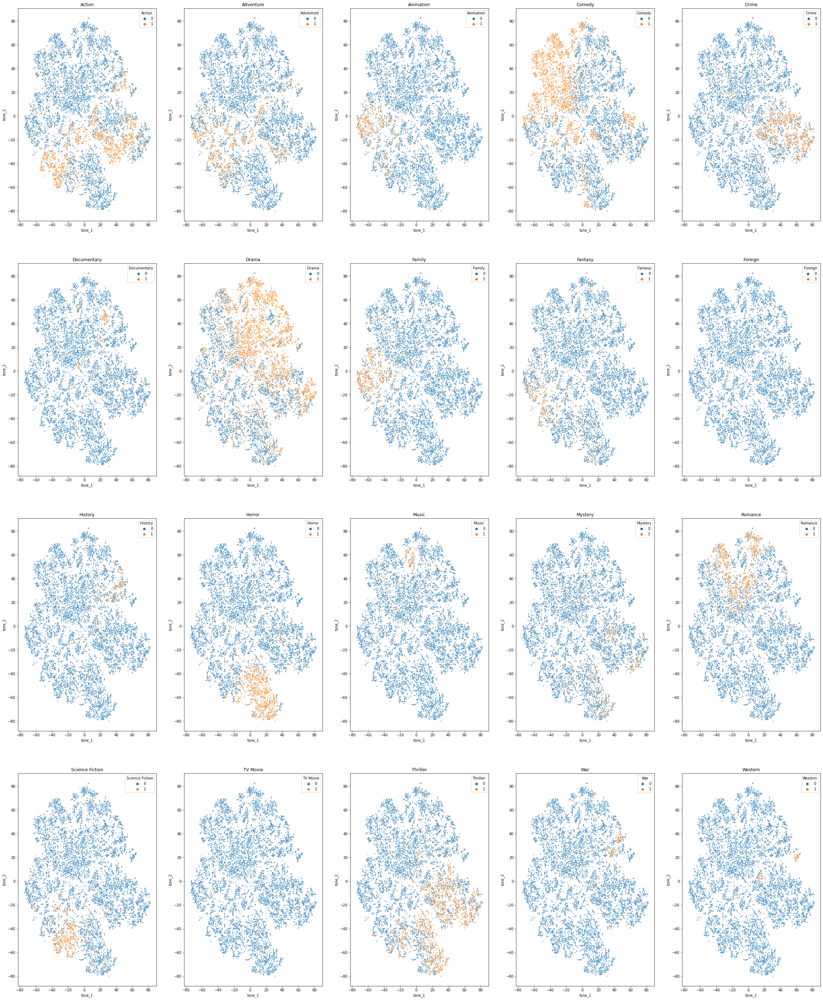

In [81]:
fig, axs = plt.subplots(4,5, figsize=(40,50))
i= 0 
for genre in genre_names:
    x = math.floor(i/(4+1))
    y = i % 5
    sns.scatterplot(
        x='tsne_1', 
        y='tsne_2', 
        hue=genre,
        ax=axs[x,y],
        data=df,
        s=5)
    axs[x,y].set_title(genre)
    i +=1

## 4. Visualize PCA

Since one movie can have more than 1 genre, we cannot plot all genres on the same plot. Thus, we will make 20 plot, one for each genre. We will use the 1st 2 principal compnents for this visualization.

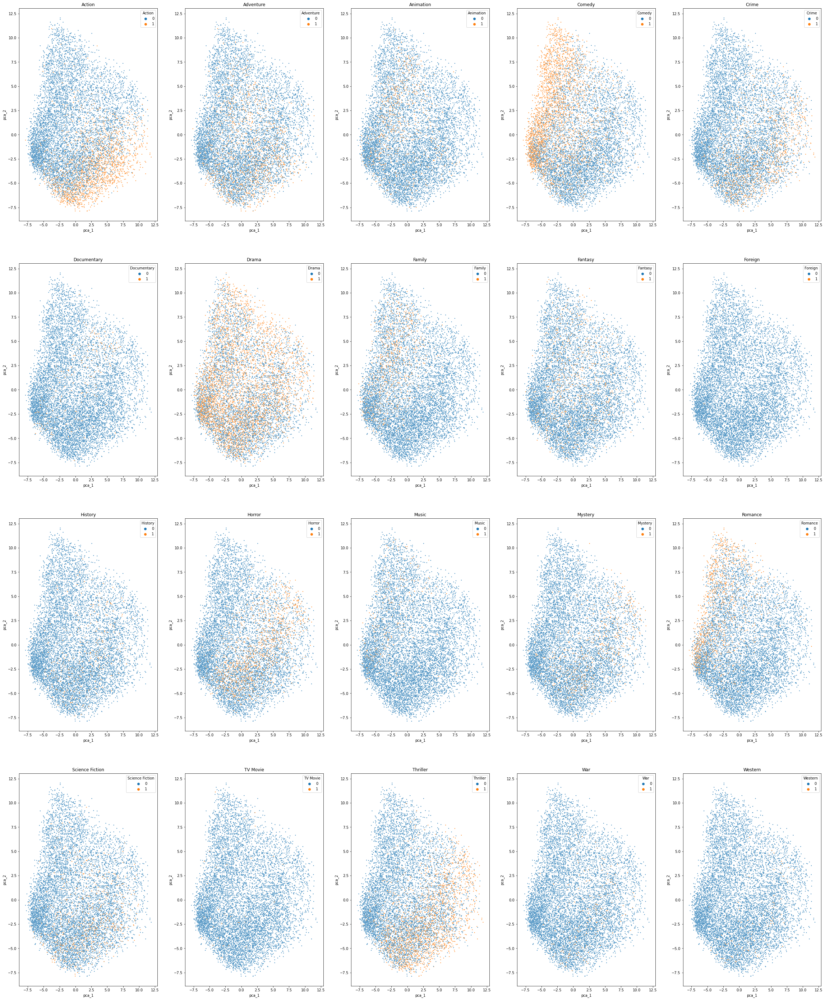

In [80]:
fig, axs = plt.subplots(4,5, figsize=(40,50))
i= 0 
for genre in genre_names:
    x = math.floor(i/(4+1))
    y = i % 5
    sns.scatterplot(
        x='pca_1', 
        y='pca_2', 
        hue=genre,
        ax=axs[x,y],
        data=df,
        s=5)
    axs[x,y].set_title(genre)
    i +=1

## 5. Load the ratings to visualize the test set

We only use ratings of users who rated at least 20 movies ositively (i.e. higher than 2.5). We aggregate those positive reviews per user. So, we end up with a table of a user ID and their respective positive ratings.

In [39]:
from test import load_testing_set

MIN_VOTES_PER_MOVIE = 50
NEUTRAL_RATING = 2.5
MIN_POSITIVE_VOTES_PER_USER = 20

test_df = load_testing_set(
        ratings_file_path='data/IMDB_Ratings/ratings.csv',
        accepted_movieIds=df['id'].to_list(),
        neutral_rating=NEUTRAL_RATING,
        min_n_pos_ratings_per_user=MIN_POSITIVE_VOTES_PER_USER
)

test_df.head()

Loading csv ...
Removings reviews for movies that did not have enough ratings ...
Removing all neutral and negative ratings ...
Finding active users ...
Grouping positive reviews per user ...


,userId,moviesWatched
0,8,"[170, 318, 553, 647, 653, 912, 968, 1265, 1266..."
1,11,"[110, 165, 260, 296, 318, 344, 364, 457, 480, ..."
2,12,"[16, 17, 82, 97, 123, 150, 162, 175, 176, 194,..."
3,15,"[6, 107, 293, 296, 441, 541, 599, 608, 745, 77..."
4,16,"[111, 198, 260, 296, 318, 380, 480, 541, 593, ..."


## 6. Transform the test set to get merged with the embeddings table

As we want to merge these movies with the t-SNE and PCA coordinates, we will have to:
1. Explode the movies watched to be one movie per column
2. Transpose the table so that each row represents a movie (like the dataframe of the embeddings and the genres).

In [40]:
mlb_watched_movies = MultiLabelBinarizer()

test_df = test_df.join(
    pd.DataFrame(
        mlb_watched_movies.fit_transform(test_df.pop('moviesWatched')),
        columns=mlb_watched_movies.classes_,
        index=test_df.index
    )
)

(20,)

In [45]:
# move the userId to the index to preapre of the transpose
test_df.set_index('userId', inplace=True)
test_df.head()

,5,6,11,12,13,14,15,16,17,18,...,170689,172533,172631,172803,172847,173185,173847,173897,174675,175291
userId,,,,,,,,,,,,,,,,,,,,,
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
15,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
16,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Since the goal of the manipulation is to to get a feel of what the watched movies look like in the t-SNE and PCA space, let's sample the users. We will only look at 4 users.

In [55]:
test_sample_df = test_df.transpose().iloc[:,-4:].add_prefix('user_')

In [58]:
test_sample_df['id'] = test_sample_df.index
test_sample_df.head()

userId,user_270892,user_270893,user_270894,user_270896,id
5,0,0,0,0,5
6,0,0,0,0,6
11,0,0,0,1,11
12,0,0,0,0,12
13,0,0,0,0,13


In [59]:
viz_test_df = pd.merge(
        left=df, 
        right=test_sample_df, 
        how='left', 
        on='id')
viz_test_df.shape

(9106, 797)

Since we merged only 4 users, there are many movies who are not watched by any of these sample users. Thus, there are many `NAN` values. We can fill those `NAN` with `0`s as it means that the movies are not watched.

In [62]:
viz_test_df.fillna(0, inplace=True)
viz_test_df.head()

,id,1,2,3,4,5,6,7,8,9,...,War,Western,tsne_1,tsne_2,pca_1,pca_2,user_270892,user_270893,user_270894,user_270896
0,862,-0.250923,-0.781930,0.734151,-0.221036,0.148259,-0.344866,-0.421963,0.254975,-0.166432,...,0,0,-58.382820,-5.429552,-3.656908,3.134591,0.0,0.0,0.0,0.0
1,8844,0.033197,-1.117250,0.962842,-0.332468,0.078707,-0.272125,0.422443,-0.010373,-0.125474,...,0,0,-61.559986,-18.621206,-0.336069,4.231027,0.0,0.0,0.0,0.0
2,15602,0.846749,-0.802798,0.034647,0.642172,0.357127,-0.014857,-0.744473,0.444755,0.425024,...,0,0,-32.680485,57.343788,-4.560597,6.700058,0.0,0.0,0.0,0.0
3,11862,0.365675,-0.588960,0.682225,0.472885,0.260920,-0.414678,-0.600607,0.735669,0.159198,...,0,0,-40.550602,45.039825,-3.180227,4.383150,0.0,0.0,0.0,0.0
4,949,-0.579526,0.431450,-0.223613,0.076954,-0.175011,-0.251801,0.909054,0.255182,0.245234,...,0,0,66.415779,-18.362318,6.528323,-2.172781,0.0,0.0,0.0,0.0


## 7. Overlay the watched movies of the sampled users on the t-SNE and PCA visualizations

0, 0
0, 1
1, 0
1, 1


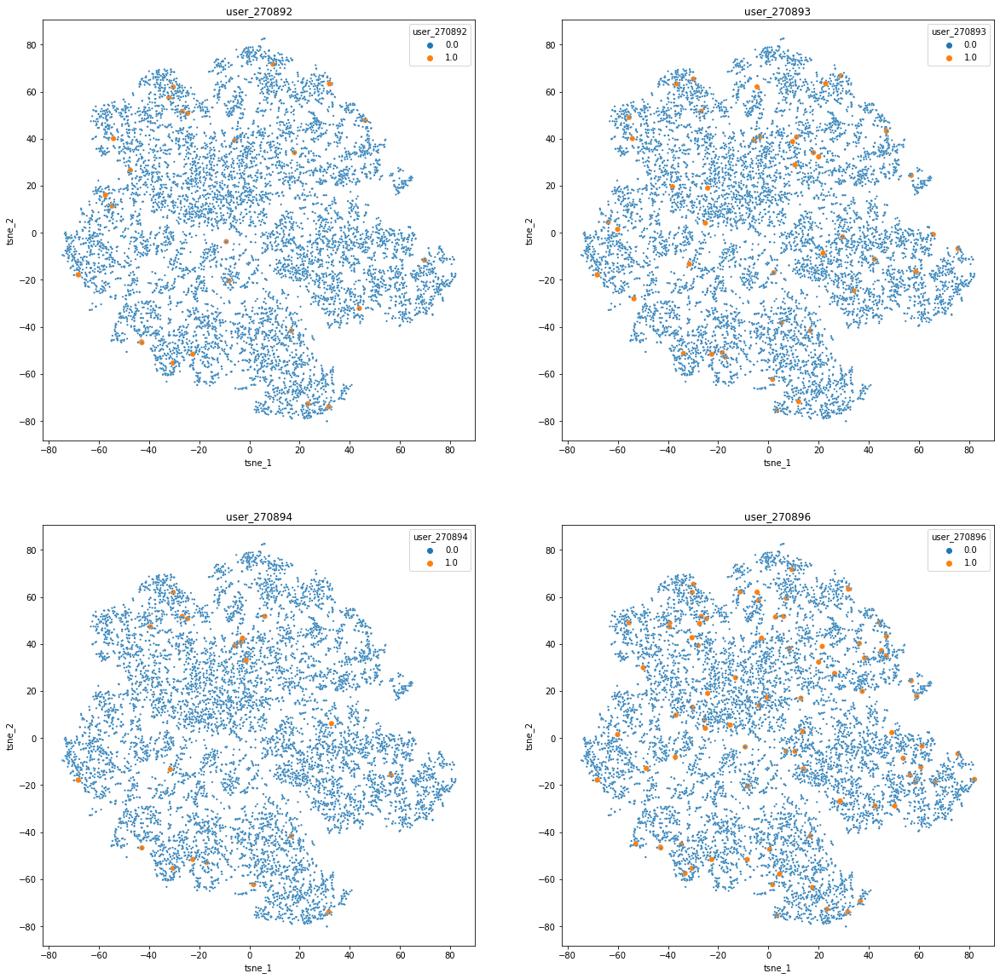

In [90]:
fig, axs = plt.subplots(2,2, figsize=(20,20))
i= 0
for user_id in list(viz_test_df.columns[-4:]):
    x = math.floor(i/(2))
    y = i % 2
    print(f'{x}, {y}')
    sns.scatterplot(
        x='tsne_1', 
        y='tsne_2', 
        hue=user_id,
        ax=axs[x,y],
        data=viz_test_df,
        s=viz_test_df[user_id].map({0: 5, 1:40}))
    axs[x,y].set_title(user_id)
    i +=1

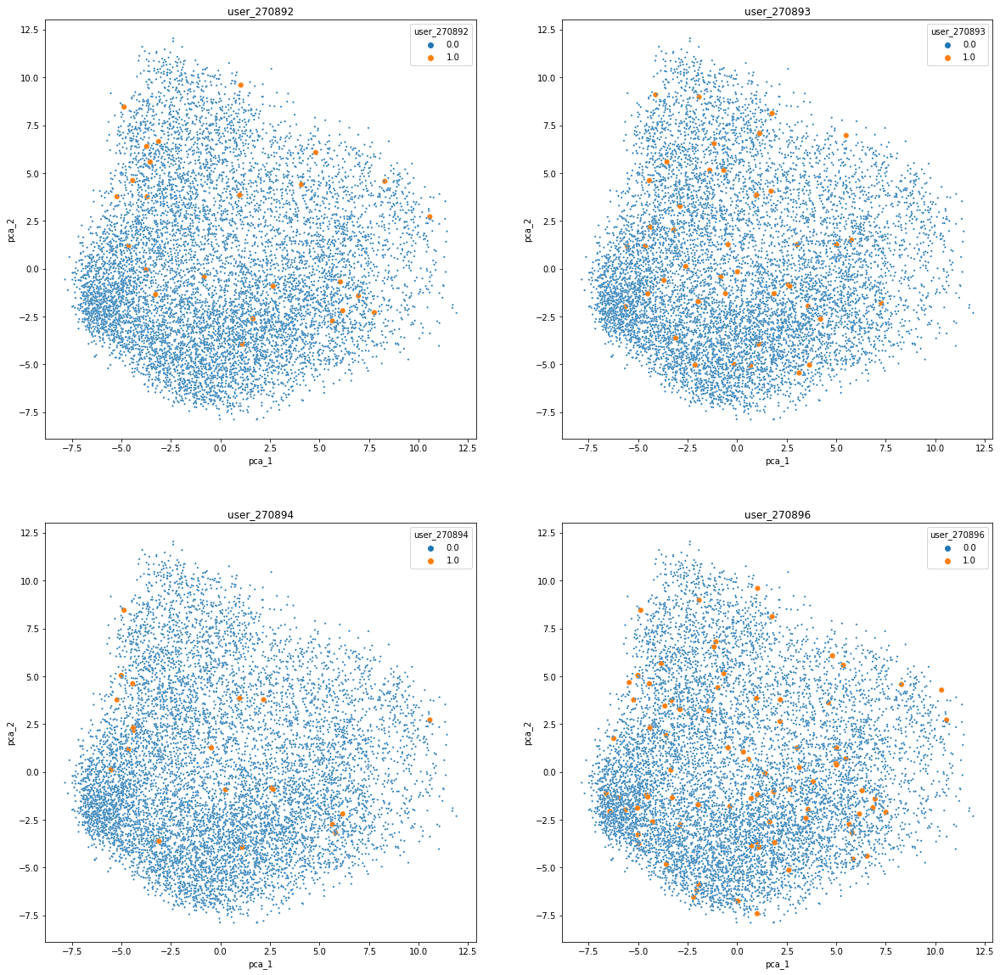

In [91]:
fig, axs = plt.subplots(2,2, figsize=(20, 20))
i= 0
for user_id in list(viz_test_df.columns[-4:]):
    x = math.floor(i/2)
    y = i % 2
    sns.scatterplot(
        x='pca_1', 
        y='pca_2', 
        hue=user_id,
        ax=axs[x,y],
        data=viz_test_df,
        s=viz_test_df[user_id].map({0: 5, 1:40}))
    axs[x,y].set_title(user_id)
    i +=1

## 8. Observations

### Clustering

Looking at the t-SNE and PCA clustering visualizations, we see that t-SNE does a decent job at clustering the different genres together. Which means that the BERT embeddings generated from our classifier did learn something about the genres.  
Morover, it is intersting to see that some genres overalp in their description. E.g. Horror and Thriller occupy very similar spaces. Action and adventure overalp a great deal. This is perhaps not suprising knowing that movies are often labelled with these genres together.

### Test set - Movies watched

Looking at the overlay of watched movies on top of both t-SNE and PCA, we see that each user watches movies that are scattered across the space. This means that our initially proposed appraoch of finding the n nearest-neighbors to each movie that a user liked (i.e. the most similar movies) may not lead to favorable results in the _hits in 100_ metric.